In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/bank-customer-churn/Customer-Churn-Records.csv


In [2]:
df = pd.read_csv("/kaggle/input/bank-customer-churn/Customer-Churn-Records.csv")

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns 

In [4]:
df.sample(10)

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Complain,Satisfaction Score,Card Type,Point Earned
8068,8069,15797710,Saunders,619,Germany,Male,29,4,98955.87,1,0,1,131712.51,0,0,2,SILVER,337
4980,4981,15740406,Padovesi,628,Germany,Male,38,10,113525.84,1,1,0,46044.48,1,1,5,PLATINUM,491
549,550,15600651,Ijendu,749,France,Male,24,1,0.00,3,1,1,47911.03,0,0,3,GOLD,758
909,910,15693814,Niu,806,Spain,Male,25,7,0.00,2,1,0,18461.90,0,0,4,PLATINUM,767
8697,8698,15644551,Wimble,751,Spain,Female,37,3,99773.85,2,1,0,54865.92,0,0,2,PLATINUM,403
2007,2008,15727384,Chukwuemeka,705,Germany,Female,43,10,146547.78,1,0,1,10072.55,1,1,1,GOLD,669
4471,4472,15642824,Onyekaozulu,826,Spain,Female,56,8,174506.10,2,0,1,161802.82,1,1,3,DIAMOND,808
8070,8071,15583764,Wilkes,791,Germany,Male,31,1,130240.33,1,0,0,96546.55,0,0,1,GOLD,608
8648,8649,15683053,Reyna,809,Spain,Female,48,2,0.00,1,1,0,160976.85,1,1,1,GOLD,994
969,970,15605926,Sinclair,649,Germany,Male,70,9,116854.71,2,0,1,107125.79,0,0,3,DIAMOND,989


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   RowNumber           10000 non-null  int64  
 1   CustomerId          10000 non-null  int64  
 2   Surname             10000 non-null  object 
 3   CreditScore         10000 non-null  int64  
 4   Geography           10000 non-null  object 
 5   Gender              10000 non-null  object 
 6   Age                 10000 non-null  int64  
 7   Tenure              10000 non-null  int64  
 8   Balance             10000 non-null  float64
 9   NumOfProducts       10000 non-null  int64  
 10  HasCrCard           10000 non-null  int64  
 11  IsActiveMember      10000 non-null  int64  
 12  EstimatedSalary     10000 non-null  float64
 13  Exited              10000 non-null  int64  
 14  Complain            10000 non-null  int64  
 15  Satisfaction Score  10000 non-null  int64  
 16  Card 

In [6]:
df.describe()

,RowNumber,CustomerId,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Complain,Satisfaction Score,Point Earned
count,10000.00000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,5000.50000,1.569094e+07,650.528800,38.921800,5.012800,76485.889288,1.530200,0.70550,0.515100,100090.239881,0.203800,0.204400,3.013800,606.515100
std,2886.89568,7.193619e+04,96.653299,10.487806,2.892174,62397.405202,0.581654,0.45584,0.499797,57510.492818,0.402842,0.403283,1.405919,225.924839
min,1.00000,1.556570e+07,350.000000,18.000000,0.000000,0.000000,1.000000,0.00000,0.000000,11.580000,0.000000,0.000000,1.000000,119.000000
25%,2500.75000,1.562853e+07,584.000000,32.000000,3.000000,0.000000,1.000000,0.00000,0.000000,51002.110000,0.000000,0.000000,2.000000,410.000000
50%,5000.50000,1.569074e+07,652.000000,37.000000,5.000000,97198.540000,1.000000,1.00000,1.000000,100193.915000,0.000000,0.000000,3.000000,605.000000
75%,7500.25000,1.575323e+07,718.000000,44.000000,7.000000,127644.240000,2.000000,1.00000,1.000000,149388.247500,0.000000,0.000000,4.000000,801.000000
max,10000.00000,1.581569e+07,850.000000,92.000000,10.000000,250898.090000,4.000000,1.00000,1.000000,199992.480000,1.000000,1.000000,5.000000,1000.000000


In [7]:
df.isna().sum()

RowNumber             0
CustomerId            0
Surname               0
CreditScore           0
Geography             0
Gender                0
Age                   0
Tenure                0
Balance               0
NumOfProducts         0
HasCrCard             0
IsActiveMember        0
EstimatedSalary       0
Exited                0
Complain              0
Satisfaction Score    0
Card Type             0
Point Earned          0
dtype: int64

In [8]:
df.duplicated().sum()

0

In [9]:
df.drop(['RowNumber','CustomerId','Surname'],axis=1,inplace=True)

In [10]:
df.sample(10)

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Complain,Satisfaction Score,Card Type,Point Earned
608,699,France,Male,35,5,0.00,2,1,1,78397.24,0,0,2,SILVER,915
2684,574,Spain,Female,28,7,0.00,2,0,0,185660.30,0,0,1,PLATINUM,626
5156,555,Spain,Male,33,5,127343.40,1,0,1,121789.30,0,0,1,PLATINUM,311
3783,647,Spain,Female,26,8,109958.15,1,1,1,136592.24,1,1,2,GOLD,271
6706,662,France,Male,64,0,98848.19,1,0,1,42730.12,0,0,1,SILVER,676
7895,668,Spain,Male,43,10,113034.31,1,1,1,100423.88,0,0,5,PLATINUM,470
6604,774,France,Female,47,6,94722.88,1,0,1,61450.96,0,0,5,DIAMOND,615
3762,590,Germany,Female,40,2,117641.43,2,0,0,92198.05,0,0,5,DIAMOND,574
556,587,Germany,Male,40,5,138241.90,2,1,0,159418.10,0,0,5,SILVER,403
1596,769,Germany,Male,27,7,188614.07,1,1,0,171344.09,0,0,1,GOLD,883


In [11]:
cat_col = ['Geography','Gender','NumOfProducts','HasCrCard','IsActiveMember','Complain','Card Type','Satisfaction Score']
num_col = ['Age','Balance','EstimatedSalary','Point Earned','Tenure']

In [12]:
df['Exited'].value_counts()

Exited
0    7962
1    2038
Name: count, dtype: int64

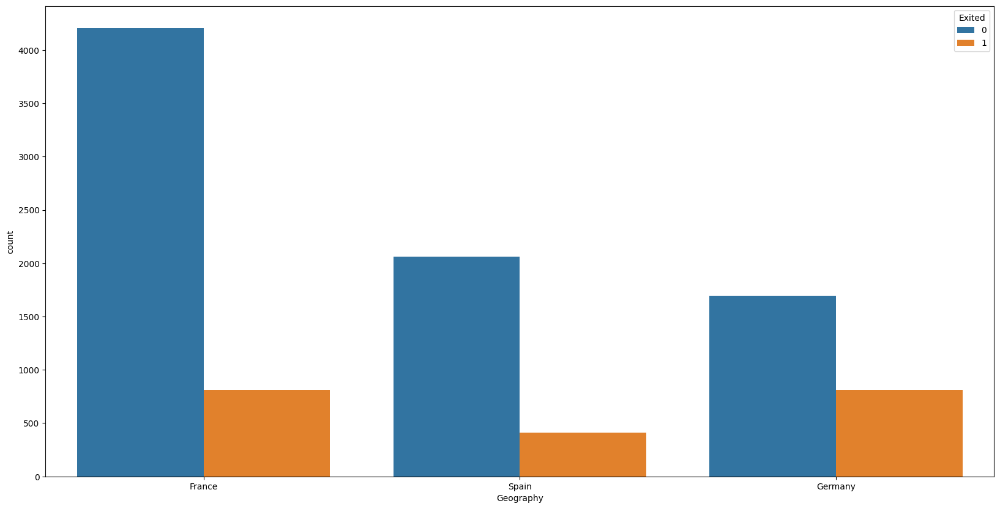

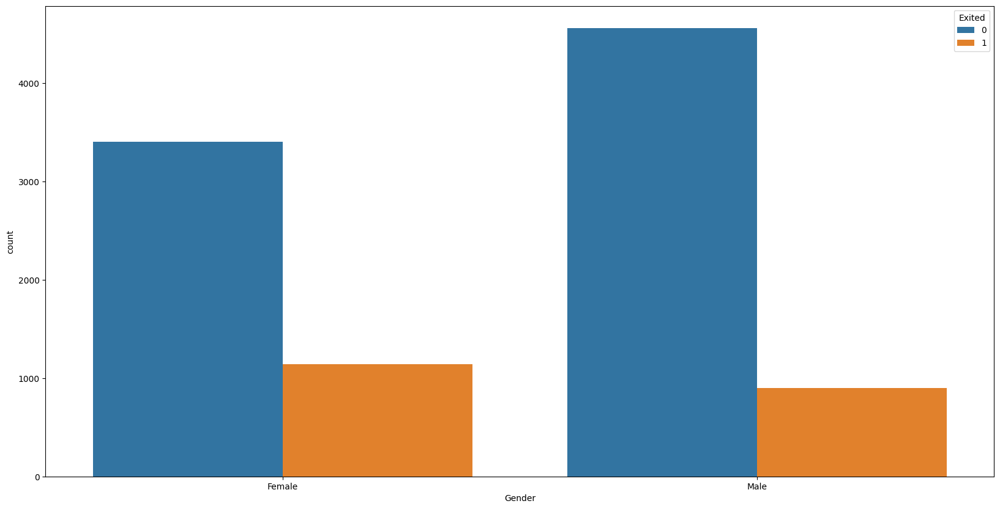

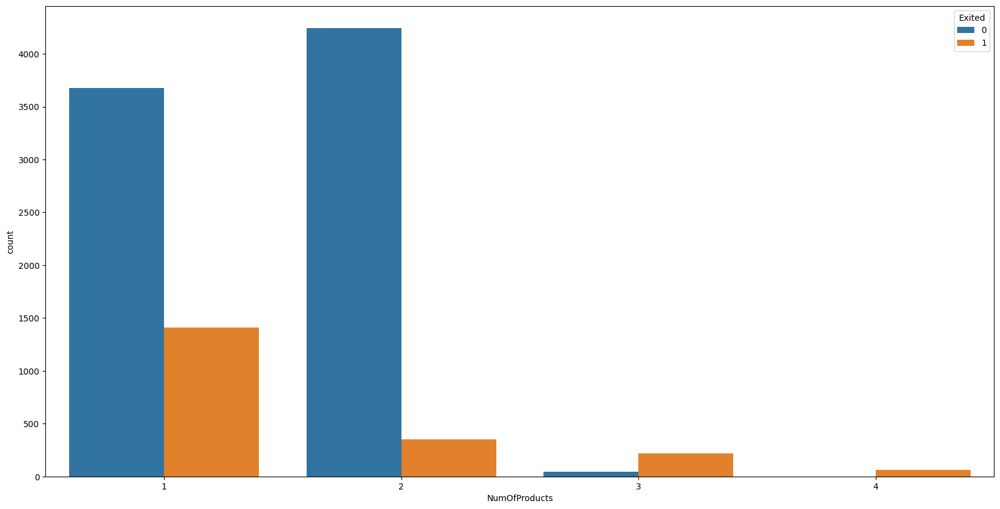

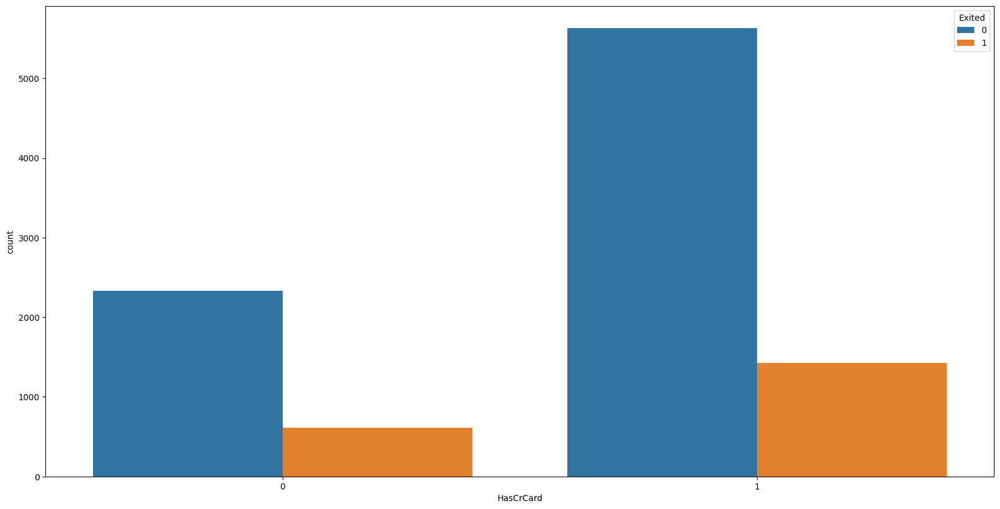

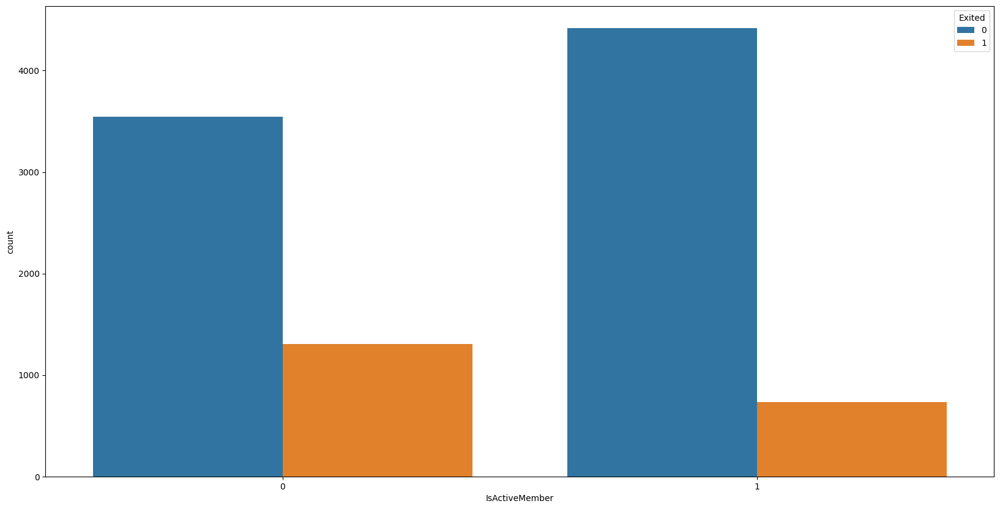

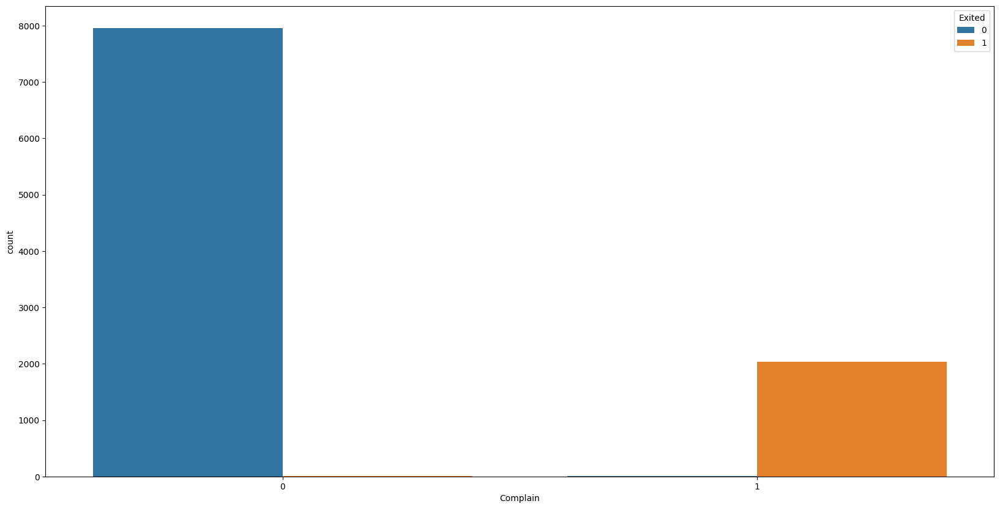

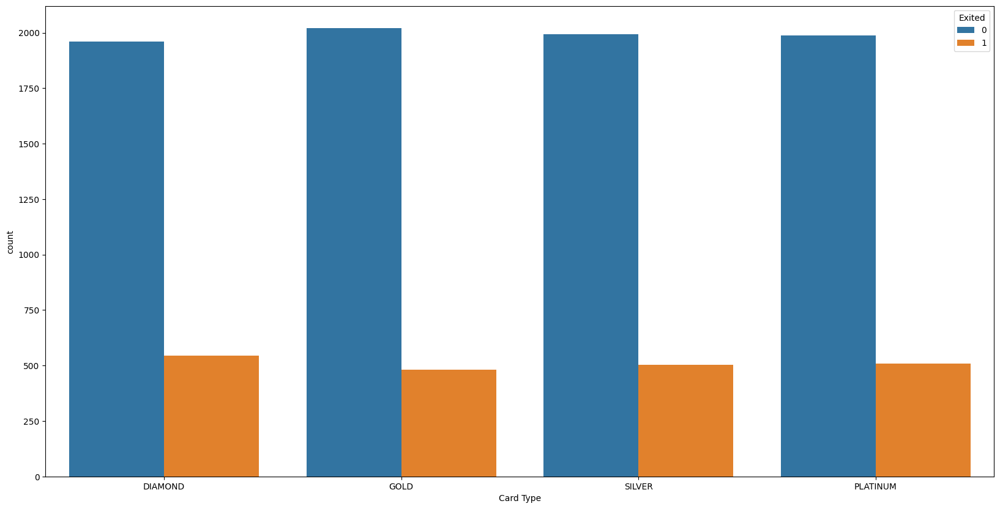

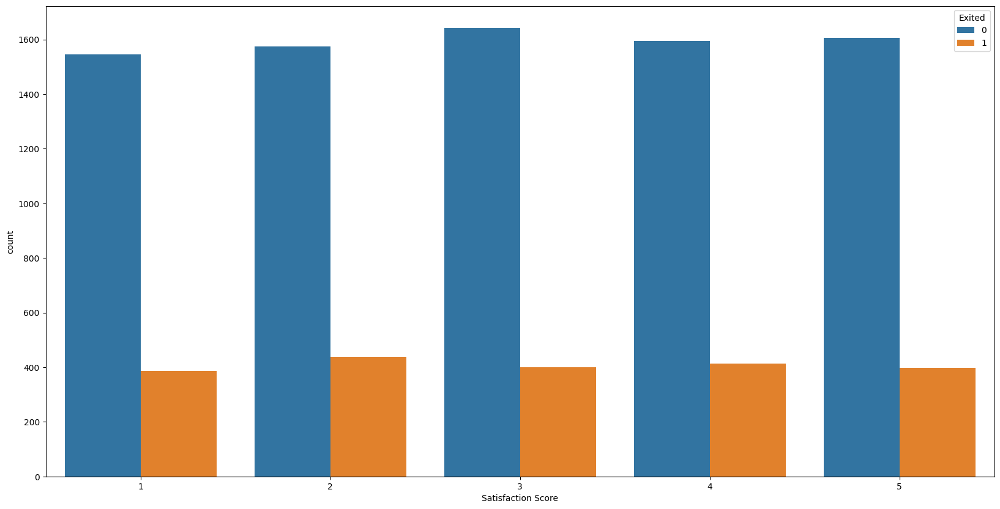

In [13]:
for col in cat_col :
    plt.figure(figsize=(20,10))
    sns.countplot(x=col,data=df,hue='Exited')
    plt.show()

/tmp/ipykernel_148/1233271192.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[col])
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


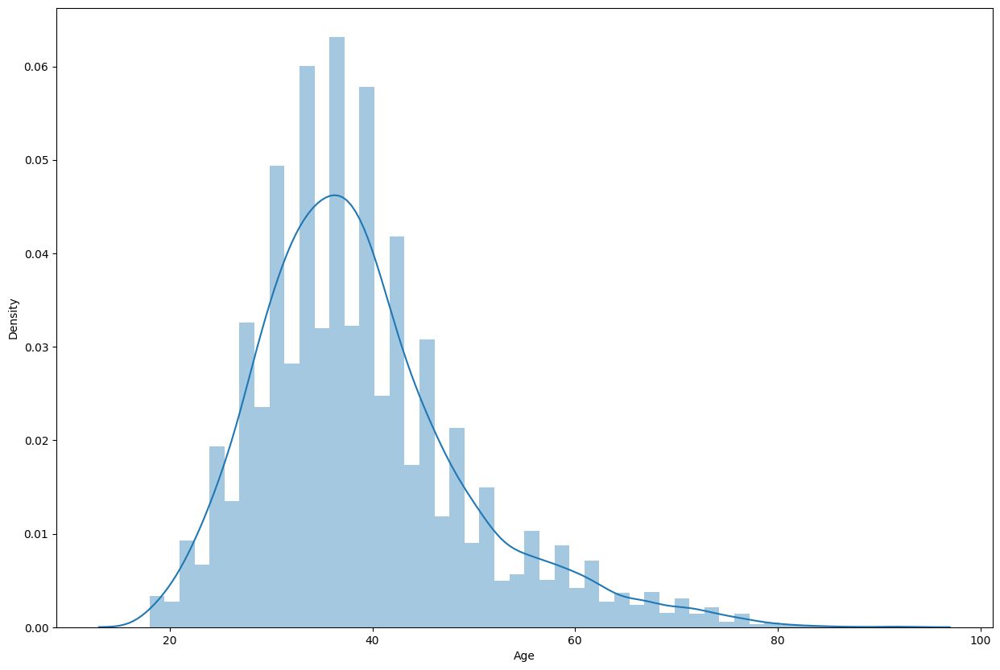

/tmp/ipykernel_148/1233271192.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[col])
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


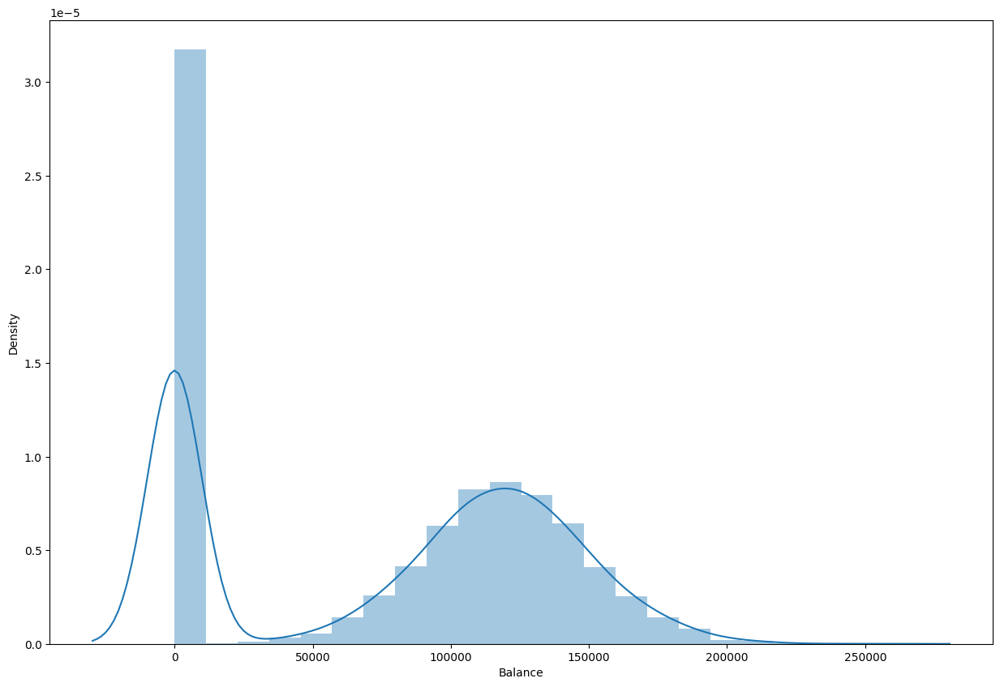

/tmp/ipykernel_148/1233271192.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[col])
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


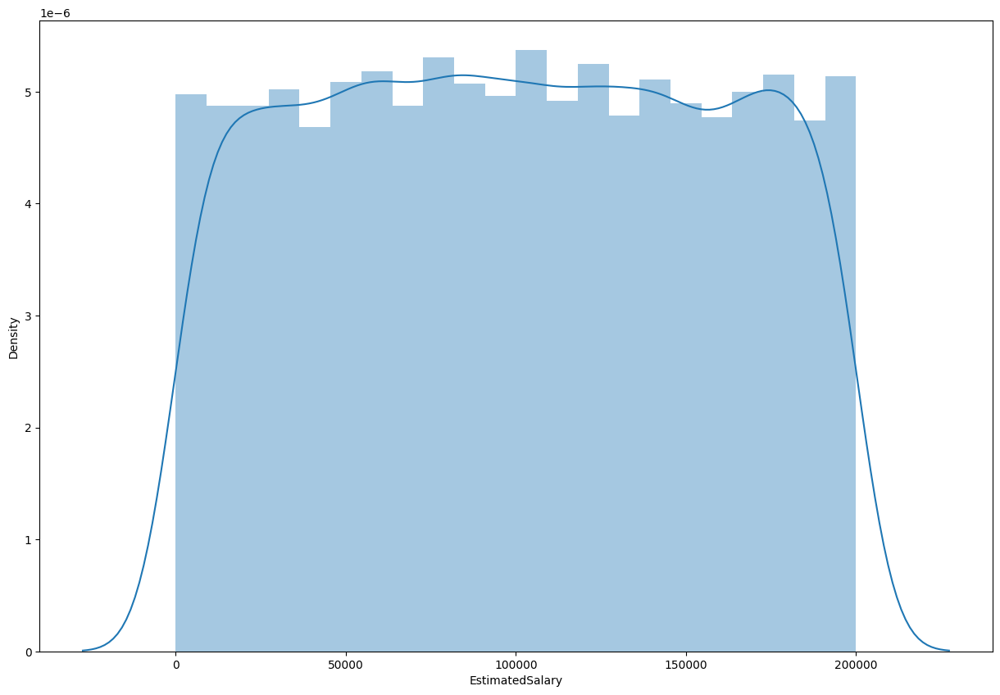

/tmp/ipykernel_148/1233271192.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[col])
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


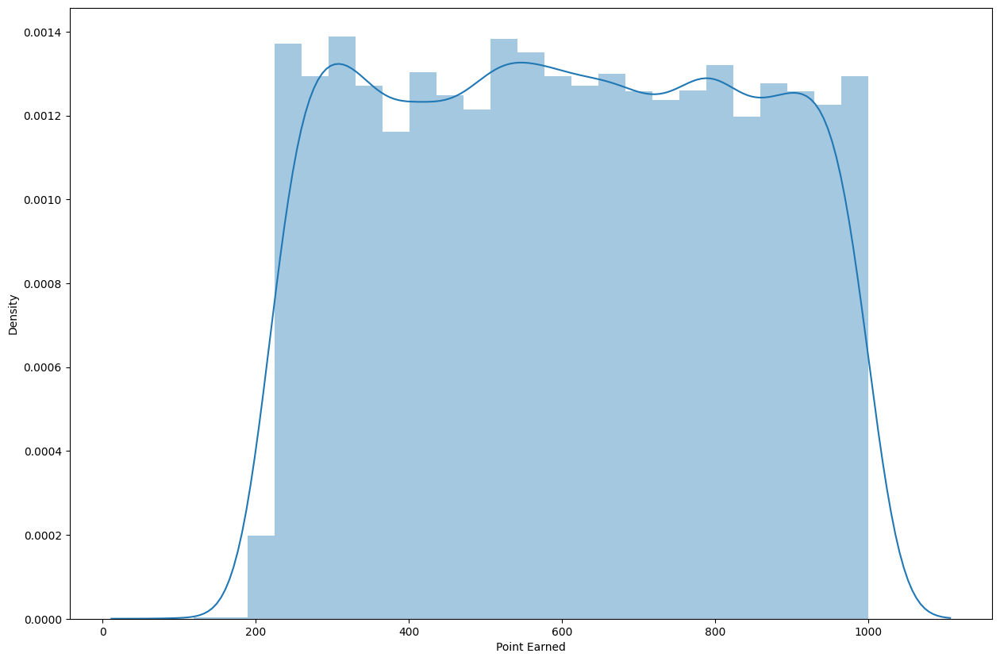

/tmp/ipykernel_148/1233271192.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[col])
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


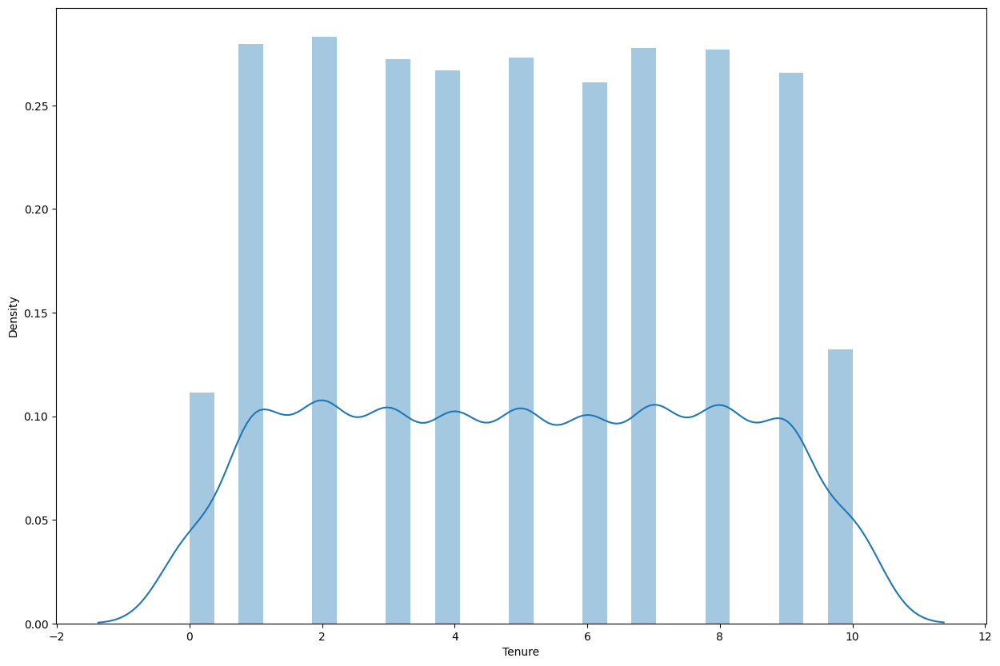

In [14]:
for col in num_col :
    plt.figure(figsize=(15,10))
    sns.distplot(df[col])
    plt.show()

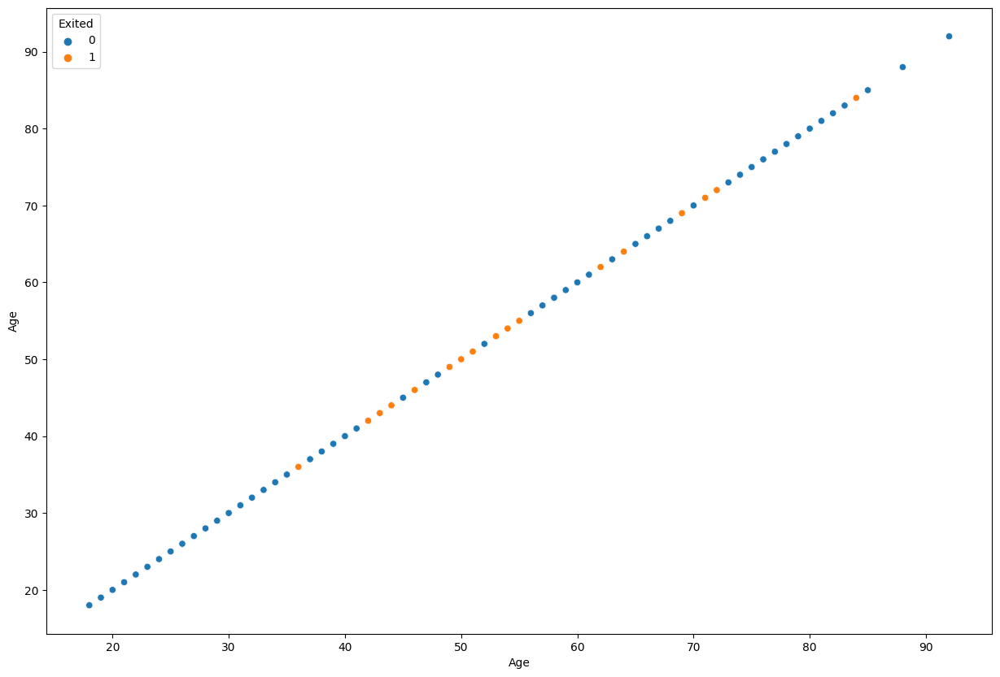

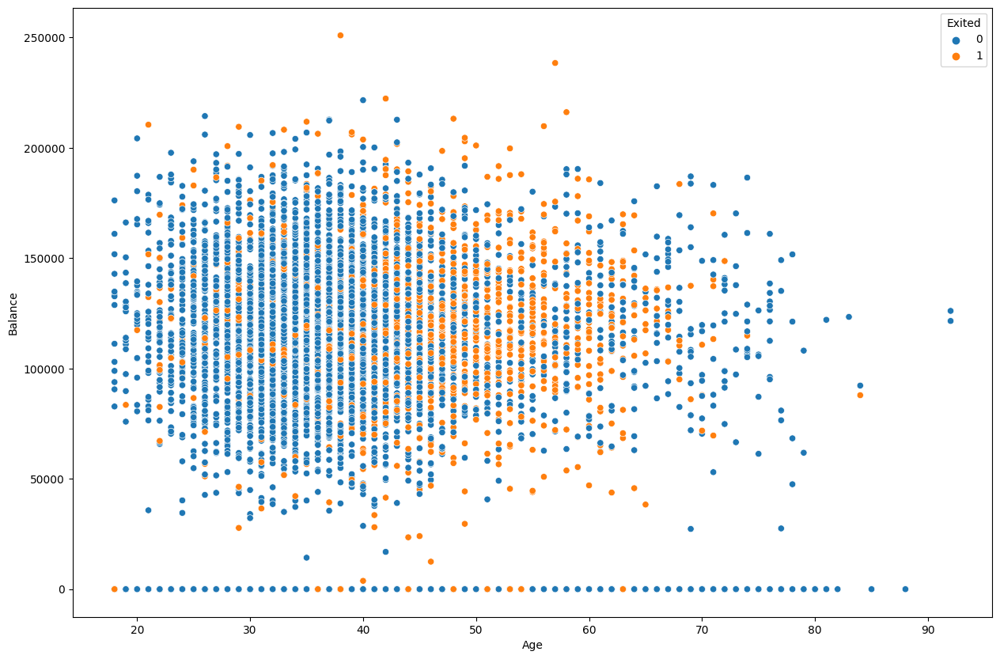

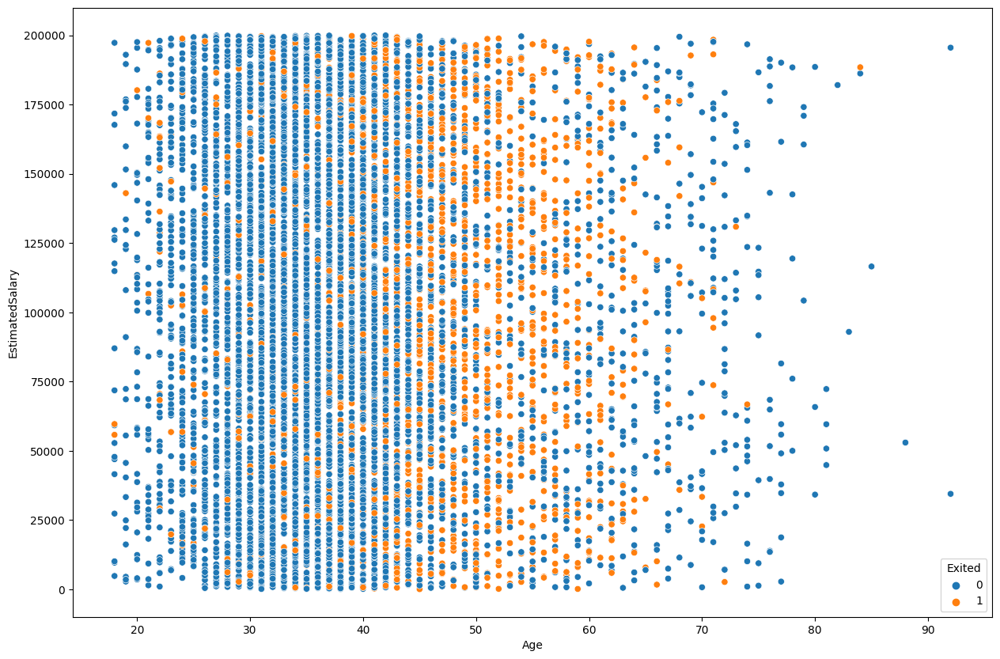

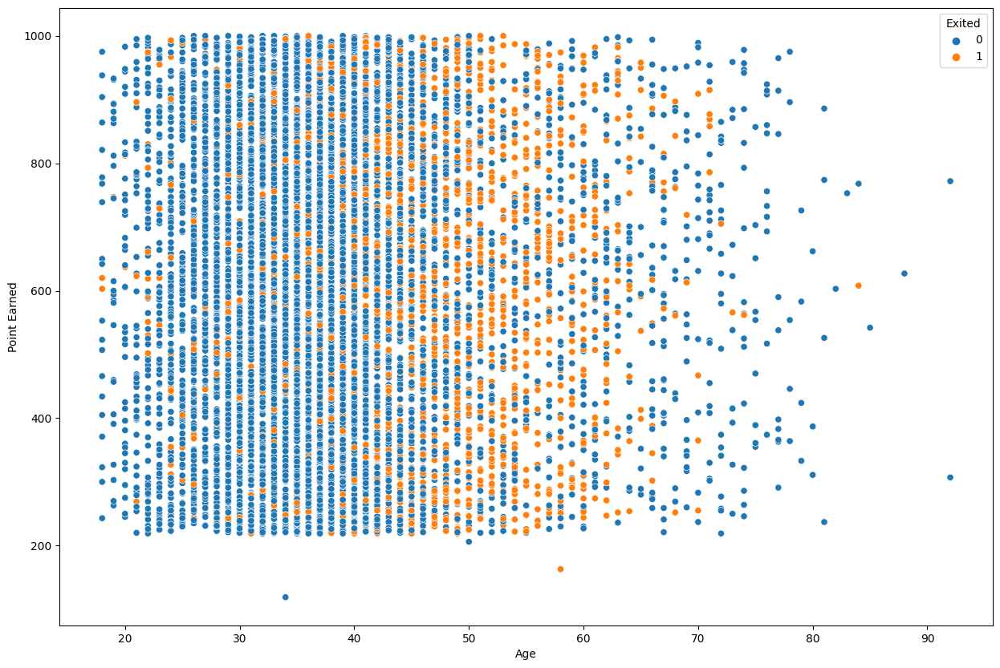

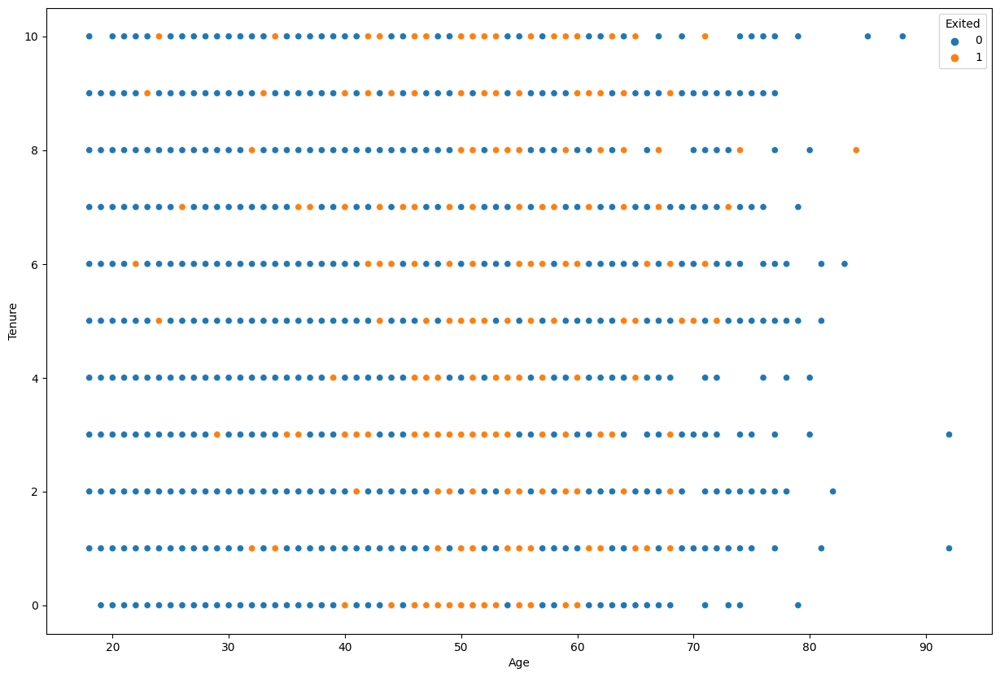

...

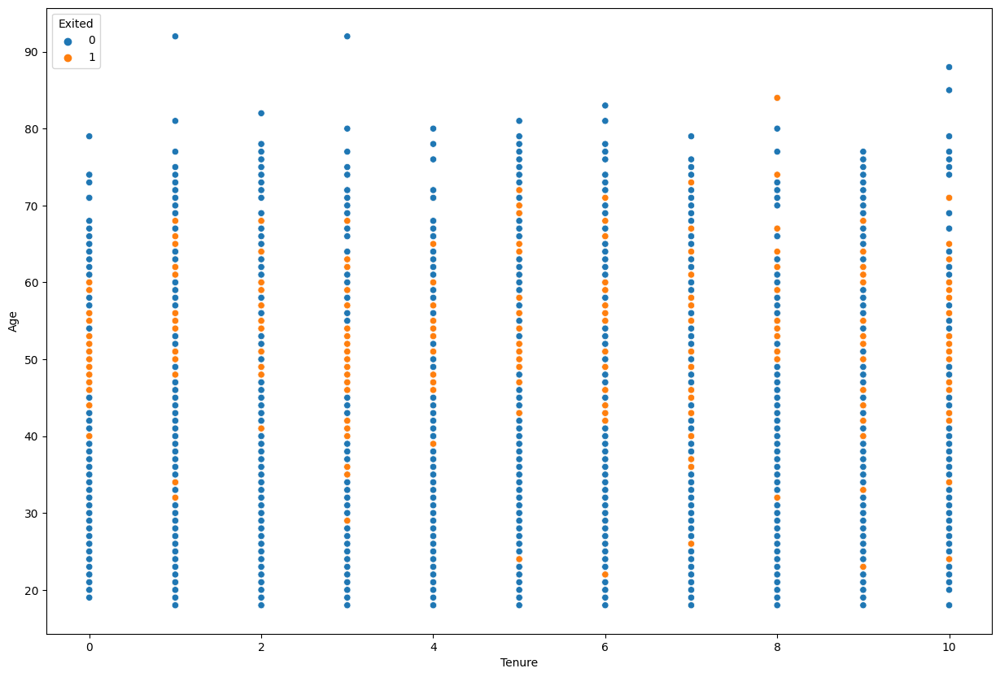

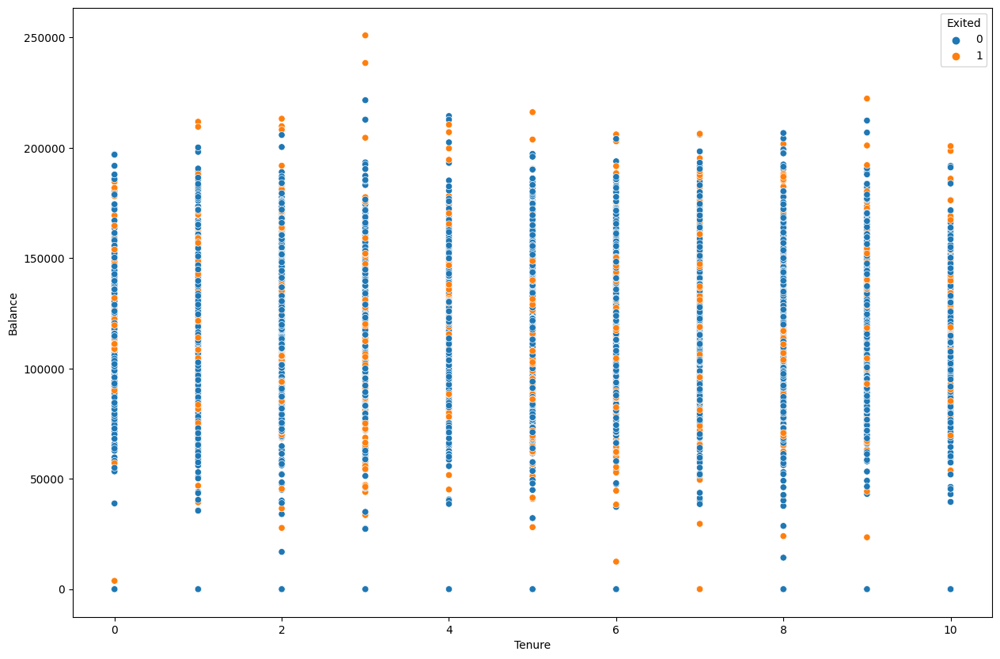

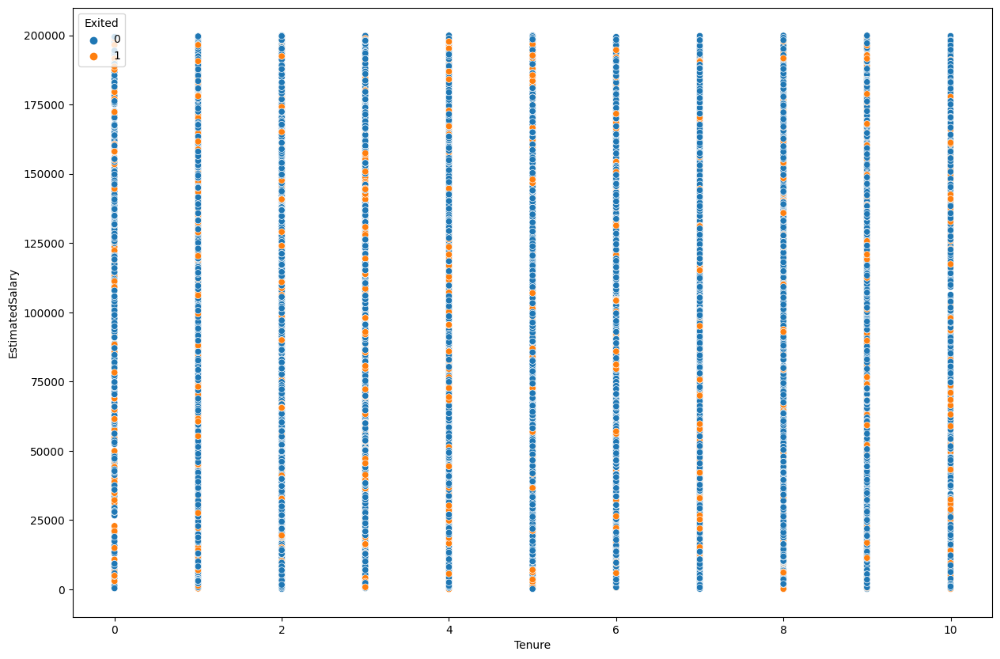

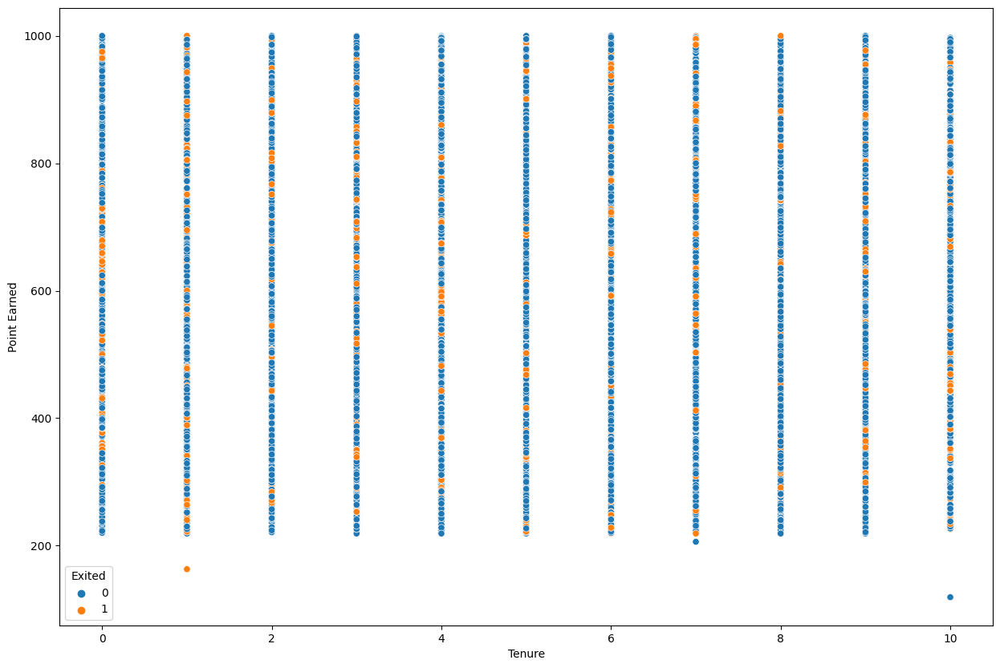

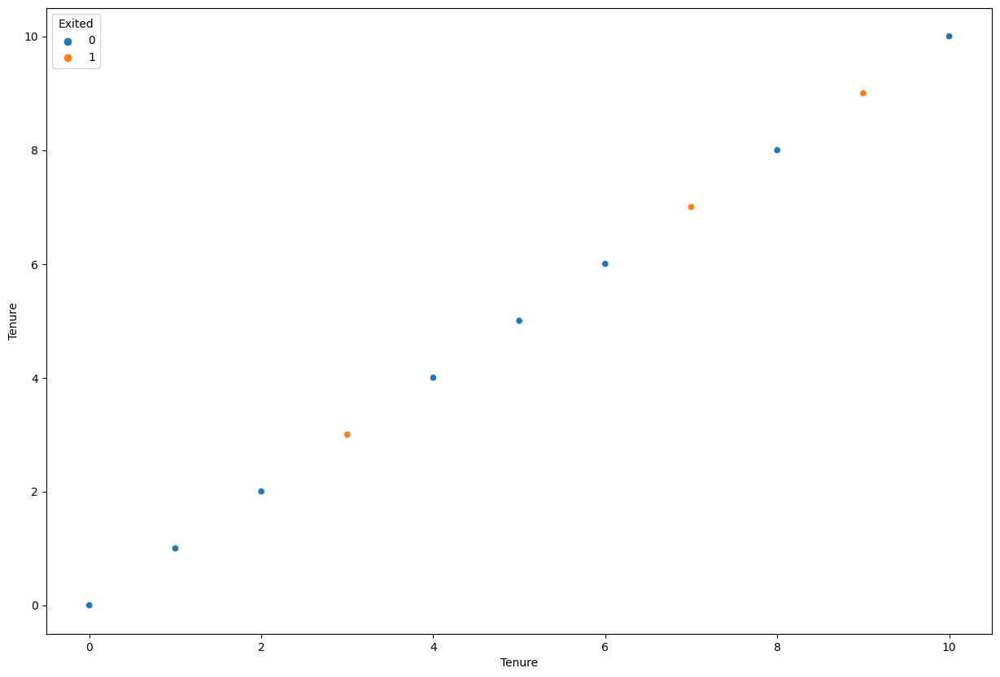

In [15]:
for i in num_col:
    for j in num_col:
        plt.figure(figsize=(15,10))
        sns.scatterplot(x=df[i],y=df[j],hue=df['Exited'])
        plt.show()

In [16]:
df.sample(10)

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Complain,Satisfaction Score,Card Type,Point Earned
3452,757,France,Male,57,3,89079.41,1,1,1,53179.21,1,1,4,DIAMOND,789
9549,578,Spain,Male,36,1,157267.95,2,1,0,141533.19,0,0,5,PLATINUM,940
2846,544,Germany,Male,39,4,142406.43,2,1,0,146637.45,0,0,1,PLATINUM,581
886,739,Spain,Male,38,0,128366.44,1,1,0,12796.43,0,0,3,PLATINUM,631
8887,435,Germany,Male,37,8,114346.30,1,0,1,980.93,1,1,1,PLATINUM,426
1269,554,France,Female,38,4,137654.05,2,1,1,172629.67,0,0,2,PLATINUM,326
2509,655,France,Female,50,10,0.00,4,1,0,179267.94,1,1,1,GOLD,889
2893,657,France,Male,50,9,0.00,2,0,0,37171.46,0,0,4,GOLD,971
4582,501,France,Male,37,4,0.00,2,0,0,12470.30,0,0,4,GOLD,453
4152,757,Germany,Male,31,8,149085.90,2,1,1,197077.36,0,0,2,SILVER,376


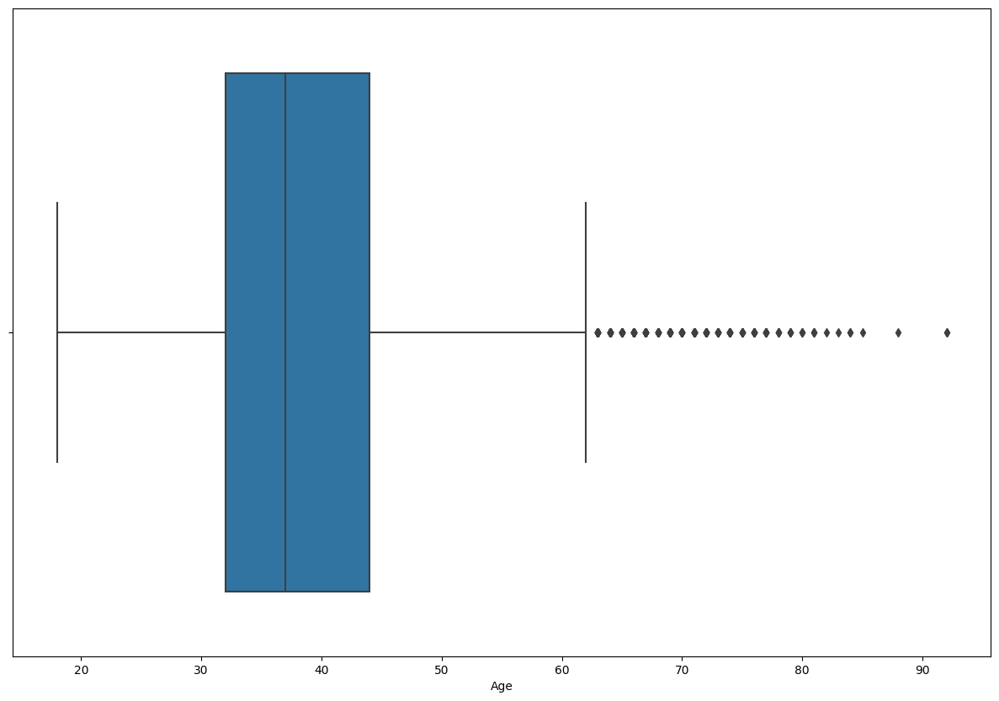

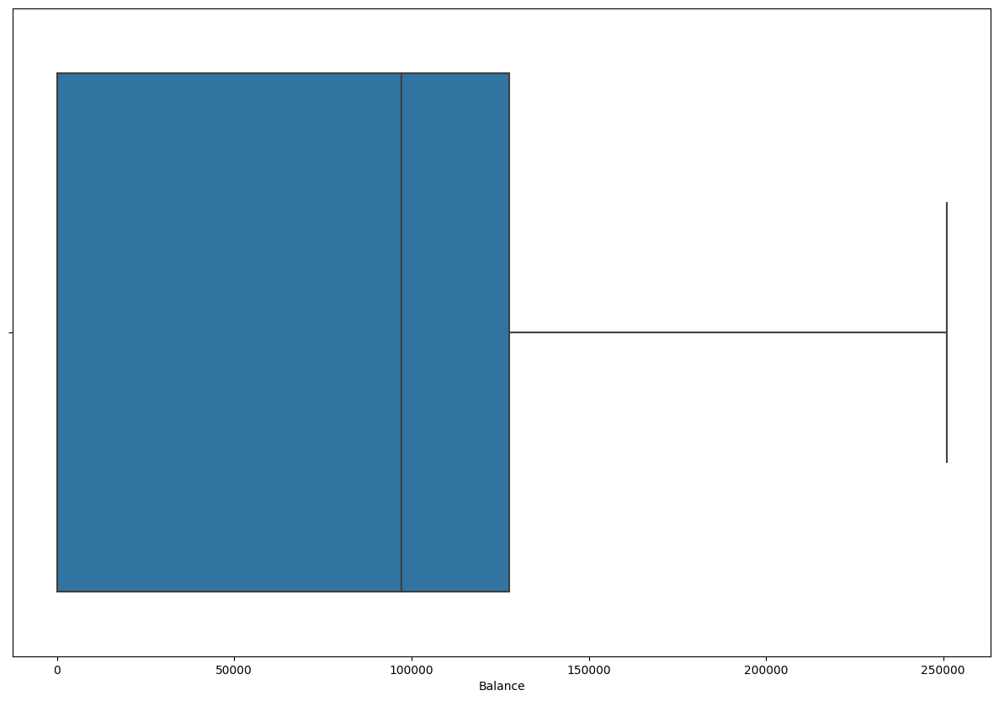

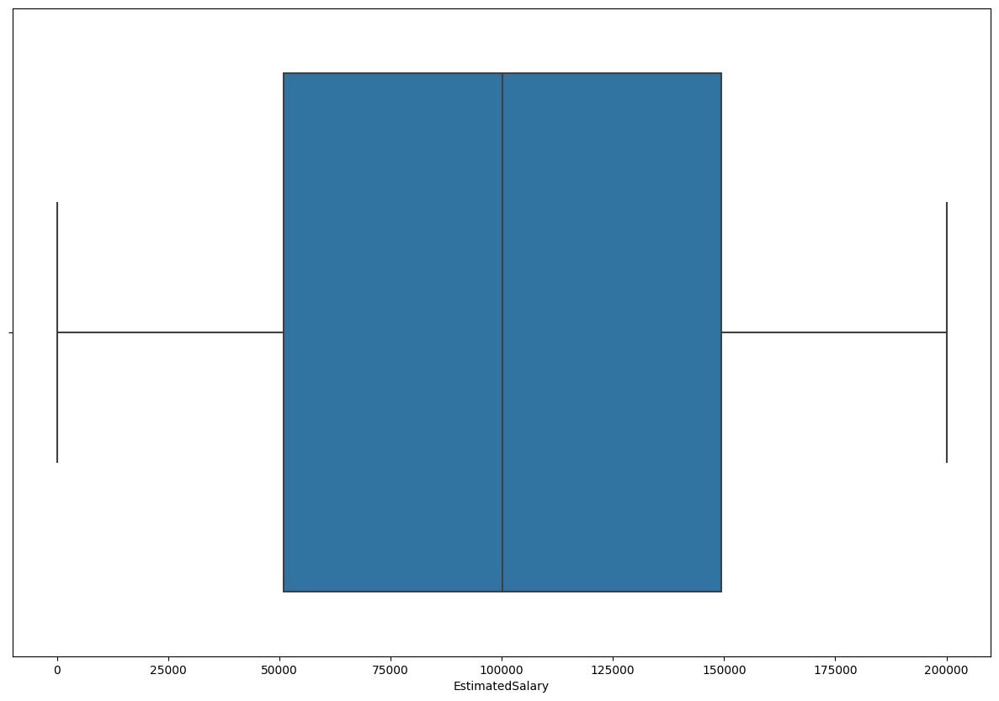

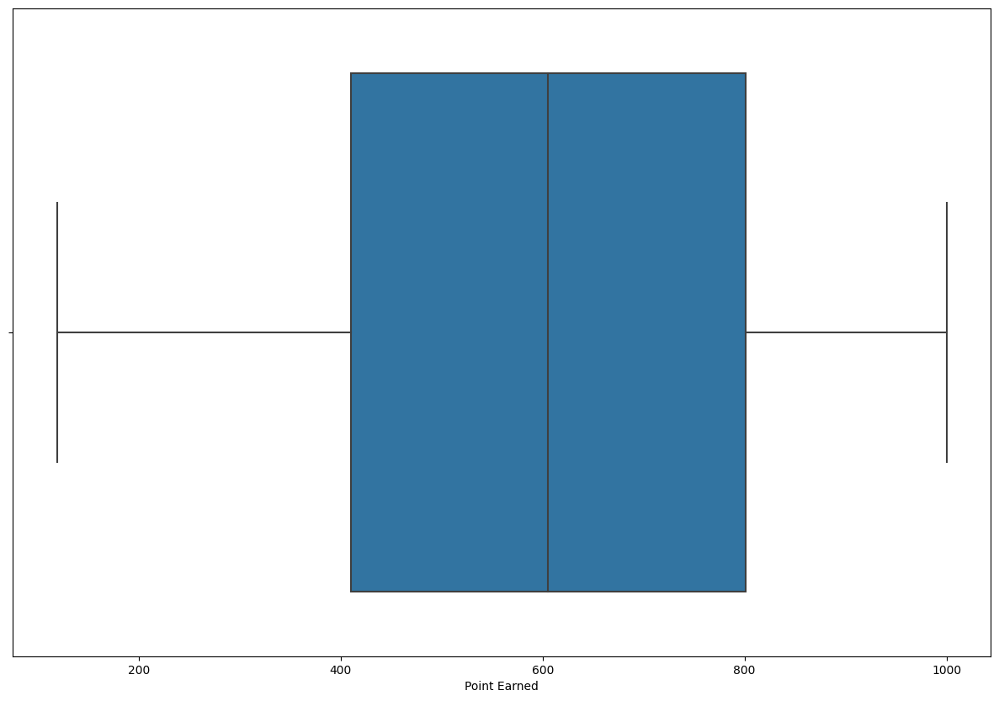

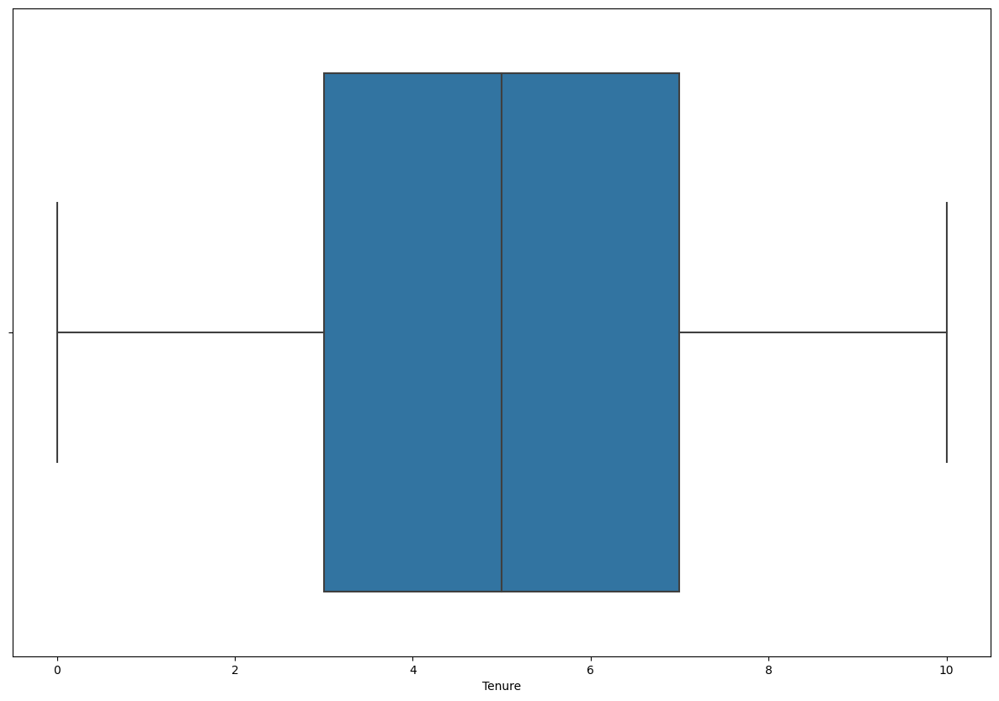

In [17]:
for col in num_col:
    plt.figure(figsize=(15,10))
    sns.boxplot(x=col,data=df)
    plt.show()

In [18]:
df.sample(10)

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Complain,Satisfaction Score,Card Type,Point Earned
6584,671,Germany,Female,23,9,123943.18,1,1,1,159553.27,0,0,2,PLATINUM,873
7800,698,Germany,Female,52,1,107906.75,1,1,0,168886.39,1,1,4,GOLD,866
3284,814,France,Male,48,9,136596.85,1,1,1,185791.90,0,0,3,GOLD,935
9759,627,France,Female,27,2,0.00,2,1,0,125451.01,0,0,3,DIAMOND,402
2624,605,Spain,Female,29,3,116805.82,1,0,0,4092.75,0,0,5,PLATINUM,851
421,586,France,Female,38,2,0.00,2,1,0,87168.46,0,0,2,SILVER,650
453,590,Spain,Female,44,3,139432.37,1,1,0,62222.81,0,0,4,PLATINUM,816
1913,757,Germany,Male,30,6,105128.85,2,1,1,62972.13,0,0,2,DIAMOND,871
3389,420,Spain,Female,55,4,91893.32,1,1,0,144870.28,1,1,3,GOLD,970
4778,737,Spain,Female,45,2,0.00,2,0,1,177695.67,0,0,2,GOLD,614


In [19]:
df = pd.get_dummies(data=df,columns=['Gender'],drop_first=True)

In [20]:
df.sample(10)

,CreditScore,Geography,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Complain,Satisfaction Score,Card Type,Point Earned,Gender_Male
1035,678,Spain,30,0,0.00,1,1,0,35113.08,0,0,4,GOLD,965,True
5472,457,Germany,42,4,126772.57,1,0,1,126106.40,0,0,3,DIAMOND,322,True
9126,753,Spain,51,4,79811.72,2,0,1,68260.27,1,1,1,DIAMOND,956,True
5203,753,Germany,30,1,110824.52,1,1,1,57896.27,0,0,3,DIAMOND,989,True
7791,584,Germany,31,6,152622.34,1,1,0,99298.80,0,0,5,DIAMOND,445,False
9894,521,France,77,6,0.00,2,1,1,49054.10,0,0,4,DIAMOND,366,False
8551,507,Spain,32,7,0.00,2,1,0,67926.18,0,0,5,SILVER,506,True
9554,779,France,29,3,46388.16,3,1,0,127939.26,1,1,3,DIAMOND,922,False
5355,597,France,29,1,132144.35,1,1,0,158086.33,0,0,1,DIAMOND,718,False
9533,651,Germany,45,6,86714.06,1,1,0,85869.89,1,1,2,PLATINUM,773,False


In [21]:
from sklearn.preprocessing import OrdinalEncoder

In [22]:
data = df.copy()

In [23]:
oe1 = OrdinalEncoder(categories=[['France','Spain','Germany']])
df[['Geography']] = oe1.fit_transform(df[['Geography']])

In [24]:
oe2 = OrdinalEncoder(categories=[['DIAMOND','PLATINUM','GOLD','SILVER']])
df[['Card Type']] = oe2.fit_transform(df[['Card Type']])

In [25]:
df['Geography'] = df['Geography'].astype(int)
df['Card Type'] = df['Card Type'].astype(int)

In [26]:
df['Card Type'].value_counts()

Card Type
0    2507
2    2502
3    2496
1    2495
Name: count, dtype: int64

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   CreditScore         10000 non-null  int64  
 1   Geography           10000 non-null  int64  
 2   Age                 10000 non-null  int64  
 3   Tenure              10000 non-null  int64  
 4   Balance             10000 non-null  float64
 5   NumOfProducts       10000 non-null  int64  
 6   HasCrCard           10000 non-null  int64  
 7   IsActiveMember      10000 non-null  int64  
 8   EstimatedSalary     10000 non-null  float64
 9   Exited              10000 non-null  int64  
 10  Complain            10000 non-null  int64  
 11  Satisfaction Score  10000 non-null  int64  
 12  Card Type           10000 non-null  int64  
 13  Point Earned        10000 non-null  int64  
 14  Gender_Male         10000 non-null  bool   
dtypes: bool(1), float64(2), int64(12)
memory usage: 1.1 MB

In [28]:
df.shape

(10000, 15)

In [29]:
corr = df.corr()

<Axes: >

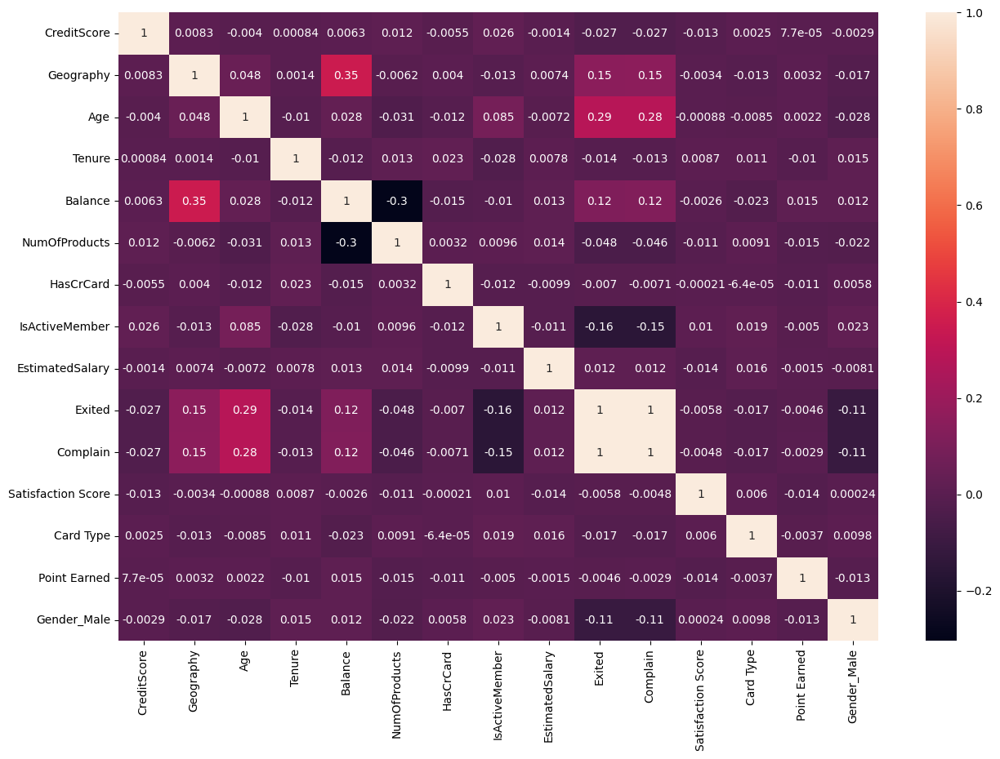

In [30]:
plt.figure(figsize=(15,10))
sns.heatmap(corr,annot=True)

In [31]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
SS = StandardScaler()

In [32]:
x = df.drop('Exited',axis=1)
y = df['Exited']

In [33]:
X_train_1,X_test_1,y_train,y_test = train_test_split(x,y,test_size = 0.2,random_state = 42)

In [34]:
X_train = SS.fit_transform(X_train_1)
X_test = SS.transform(X_test_1)

In [35]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report

In [36]:
lr = LogisticRegression(class_weight='balanced')
lr.fit(X_train,y_train)
y_pred = lr.predict(X_test)
print(classification_report(y_pred,y_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1607
           1       1.00      1.00      1.00       393

    accuracy                           1.00      2000
   macro avg       1.00      1.00      1.00      2000
weighted avg       1.00      1.00      1.00      2000



In [37]:
rf = RandomForestClassifier(class_weight='balanced')
rf.fit(X_train,y_train)
y_pred1 = rf.predict(X_test)
print(classification_report(y_pred1,y_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1607
           1       1.00      1.00      1.00       393

    accuracy                           1.00      2000
   macro avg       1.00      1.00      1.00      2000
weighted avg       1.00      1.00      1.00      2000



In [38]:
xg = XGBClassifier(class_weight='balanced')
xg.fit(X_train,y_train)
y_pred2 = xg.predict(X_test)
print(classification_report(y_pred2,y_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1607
           1       1.00      1.00      1.00       393

    accuracy                           1.00      2000
   macro avg       1.00      1.00      1.00      2000
weighted avg       1.00      1.00      1.00      2000



/usr/local/lib/python3.11/dist-packages/xgboost/core.py:160: UserWarning: [19:07:30] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "class_weight" } are not used.

  warnings.warn(smsg, UserWarning)


In [39]:
from sklearn.model_selection import cross_val_score, RandomizedSearchCV

In [40]:
np.mean(cross_val_score(lr,X_train,y_train, groups=None, scoring='accuracy', cv=5, n_jobs=-1))


0.9985000000000002

In [41]:
np.mean(cross_val_score(rf,X_train,y_train, groups=None, scoring='precision', cv=5, n_jobs=-1))


0.9945637203125213

In [42]:
np.mean(cross_val_score(xg,X_train,y_train, groups=None, scoring='accuracy', cv=15, n_jobs=-1))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:160: UserWarning: [19:07:34] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "class_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:160: UserWarning: [19:07:34] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "class_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:160: UserWarning: [19:07:34] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "class_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:160: UserWarning: [19:07:34] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "class_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:160: UserWarning: [19:07:35] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "class_weight" } are not used.



0.9984999988288561

In [43]:
xg1 = XGBClassifier(class_weight='balanced')
params = {
    # Tree growth
    "n_estimators": [100, 200, 300, 500],
    "max_depth": [3, 4, 5, 6, 8, 10],
    "min_child_weight": [1, 3, 5, 7],
    "gamma": [0, 0.1, 0.2, 0.3, 0.5],

    # Learning control
    "learning_rate": [0.01, 0.05, 0.1, 0.2],
    "subsample": [0.6, 0.7, 0.8, 0.9, 1.0],
    "colsample_bytree": [0.6, 0.7, 0.8, 0.9, 1],

    # Regularization
    "reg_alpha": [0, 0.01, 0.1, 1],
    "reg_lambda": [0.5, 1, 1.5, 2],

    # Class imbalance
    "scale_pos_weight": [1, 2, 5, 10, 20]  # acts like class weight
}


In [44]:
xgb_cv = RandomizedSearchCV(xg1,params,n_iter=10,cv=5,verbose=False,n_jobs=-1)

In [45]:
xgb_cv.fit(X_train,y_train)

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:160: UserWarning: [19:07:35] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "class_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:160: UserWarning: [19:07:35] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "class_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:160: UserWarning: [19:07:35] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "class_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:160: UserWarning: [19:07:35] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "class_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:160: UserWarning: [19:07:35] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "class_weight" } are not used.



RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           class_weight='balanced',
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constr...
                   n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.6, 0.7, 0.8, 0.9,
                                                             1],
                                        'gamma': [0, 0.1, 0.2, 0.3, 0.5],
                                        'learning_rate': [0.01, 0.05, 0.1, 0.2],
                                        'max_depth': [3, 4, 5, 6, 8, 10],
                                        'min_child_weight': [1, 3, 5, 7],
                                        'n_estimators': [100, 200, 300, 500],
                                        'reg_alpha': [0, 0.01, 0.1, 1],
                                        'reg_lambda': [0.5, 1, 1.5, 2],
                                        'scale_pos_weight': [1, 2, 5, 10, 20],
                                        'subsample': [0.6, 0.7, 0.8, 0.9, 1.0]},
                   verbose=False)

In [46]:
xgb_cv.best_score_

0.9985000000000002

In [47]:
xgb_cv.best_params_

{'subsample': 0.8,
 'scale_pos_weight': 1,
 'reg_lambda': 2,
 'reg_alpha': 0.1,
 'n_estimators': 100,
 'min_child_weight': 5,
 'max_depth': 10,
 'learning_rate': 0.05,
 'gamma': 0.1,
 'colsample_bytree': 0.6}

In [48]:
from sklearn.compose import ColumnTransformer

In [49]:
COL_T = ColumnTransformer([
    ('OEn1',OrdinalEncoder(categories=[['DIAMOND','PLATINUM','GOLD','SILVER']]),['Card Type']),
    ('OEn2',OrdinalEncoder(categories=[['France','Spain','Germany']]),['Geography'])
],remainder='passthrough')

In [50]:
SSc = StandardScaler()
Xgb = XGBClassifier(
    subsample=0.9,
    scale_pos_weight=2,
    reg_lambda=0.5,
    reg_alpha=0.01,
    n_estimators=200,
    min_child_weight=3,
    max_depth=4,
    learning_rate=0.01,
    gamma=0.5,
    colsample_bytree=0.7,
    use_label_encoder=False,   
    eval_metric="logloss" )

In [51]:
from sklearn.pipeline import Pipeline

In [52]:
model =  Pipeline([
    ('Colmn',COL_T),
    ('SScaler',SSc),
    ('XGB',Xgb)
])

In [53]:
data.sample(10)

,CreditScore,Geography,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Complain,Satisfaction Score,Card Type,Point Earned,Gender_Male
7511,757,France,38,0,0.00,1,1,0,83263.06,0,0,1,PLATINUM,537,True
4704,588,France,35,0,0.00,2,1,1,155485.24,0,0,3,PLATINUM,496,False
8616,653,Spain,27,6,107751.68,2,1,1,33389.42,0,0,3,GOLD,563,False
8543,680,Germany,30,4,108300.27,2,0,1,44384.57,1,1,3,DIAMOND,860,True
788,562,Spain,35,0,0.00,2,1,0,119899.52,0,0,2,SILVER,814,False
5346,603,France,31,1,129743.75,1,1,0,109145.20,0,0,1,PLATINUM,664,True
2586,691,France,50,6,136953.47,1,1,1,2704.98,0,0,5,PLATINUM,469,True
2036,782,Spain,34,6,147422.44,1,0,1,42143.61,0,0,5,GOLD,960,True
3035,817,Germany,45,9,101207.75,1,0,0,88211.12,1,1,2,SILVER,847,True
7801,678,France,54,7,128914.97,1,0,0,191746.23,1,1,2,SILVER,323,True


In [56]:
X = data.drop('Exited',axis=1)
Y = data['Exited']
X_tr,X_tt,y_tr,y_tt = train_test_split(X,Y,test_size=0.2,random_state=1)

In [57]:
model.fit(X_tr,y_tr)

Pipeline(steps=[('Colmn',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('OEn1',
                                                  OrdinalEncoder(categories=[['DIAMOND',
                                                                              'PLATINUM',
                                                                              'GOLD',
                                                                              'SILVER']]),
                                                  ['Card Type']),
                                                 ('OEn2',
                                                  OrdinalEncoder(categories=[['France',
                                                                              'Spain',
                                                                              'Germany']]),
                                                  ['Geography'])])),
                ('SScaler', StandardScaler()),
                ('XGB',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               c...
                               feature_types=None, gamma=0.5, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=0.01,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=4, max_leaves=None, min_child_weight=3,
                               missing=nan, monotone_constraints=None,
                               multi_strategy=None, n_estimators=200,
                               n_jobs=None, num_parallel_tree=None,
                               random_state=None, ...))])

In [58]:
y_pr = model.predict(X_tt)

In [59]:
print(classification_report(y_pr,y_tt))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1583
           1       1.00      0.99      1.00       417

    accuracy                           1.00      2000
   macro avg       1.00      1.00      1.00      2000
weighted avg       1.00      1.00      1.00      2000



In [60]:
import pickle 

In [61]:
with open('Churn_pred','wb') as f:
    pickle.dump(model,f)